# Implémentez un modèle de scoring

    * Vous êtes Data Scientist au sein d'une société financière, nommée "Prêt à dépenser",  qui propose des crédits à la consommation pour des personnes ayant peu ou pas du tout d'historique de prêt.
    
    * L’entreprise souhaite mettre en œuvre un outil de “scoring crédit” pour calculer la probabilité qu’un client rembourse son crédit, puis classifie la demande en crédit accordé ou refusé. Elle souhaite donc développer un algorithme de classification en s’appuyant sur des sources de données variées (données comportementales, données provenant d'autres institutions financières, etc.).

    * De plus, les chargés de relation client ont fait remonter le fait que les clients sont de plus en plus demandeurs de transparence vis-à-vis des décisions d’octroi de crédit. Cette demande de transparence des clients va tout à fait dans le sens des valeurs que l’entreprise veut incarner.

    * Prêt à dépenser décide donc de développer un dashboard interactif pour que les chargés de relation client puissent à la fois expliquer de façon la plus transparente possible les décisions d’octroi de crédit, mais également permettre à leurs clients de disposer de leurs informations personnelles et de les explorer facilement.
    
    ==>>> Vous aurez sûrement besoin de joindre les différentes tables entre elles.

### Votre mission
    * Construire un modèle de scoring qui donnera une prédiction sur la probabilité de faillite d'un client de façon automatique.
    Construire un dashboard interactif à destination des gestionnaires de la relation client permettant d'interpréter les prédictions faites par le modèle, et d’améliorer la connaissance client des chargés de relation client.
    Michaël, votre manager, vous incite à sélectionner un kernel Kaggle pour vous faciliter la préparation des données nécessaires à l’élaboration du modèle de scoring. Vous analyserez ce kernel et l’adapterez pour vous assurer qu’il répond aux besoins de votre mission.

    >>> Vous pourrez ainsi vous focaliser sur l’élaboration du modèle, son optimisation et sa compréhension.

### Spécifications du dashboard
    Michaël vous a fourni des spécifications pour le dashboard interactif. Celui-ci devra contenir au minimum les fonctionnalités suivantes :

    Permettre de visualiser le score et l’interprétation de ce score pour chaque client de façon intelligible pour une personne non experte en data science.
    Permettre de visualiser des informations descriptives relatives à un client (via un système de filtre).
    Permettre de comparer les informations descriptives relatives à un client à l’ensemble des clients ou à un groupe de clients similaires.
### Livrables 
    Le dashboard interactif répondant aux spécifications ci-dessus et l’API de prédiction du score, déployées chacunes sur le cloud.
    Un dossier sur un outil de versioning de code contenant :
    Le code de la modélisation (du prétraitement à la prédiction)
    Le code générant le dashboard
    Le code permettant de déployer le modèle sous forme d'API
    Une note méthodologique décrivant :
    La méthodologie d'entraînement du modèle (2 pages maximum)
    La fonction coût métier, l'algorithme d'optimisation et la métrique d'évaluation (1 page maximum)
    L’interprétabilité globale et locale du modèle (1 page maximum)
    Les limites et les améliorations possibles (1 page maximum)
    Un support de présentation pour la soutenance, détaillant le travail réalisé.

In [1]:
import pandas as pd
import seaborn as sns
import glob
import pickle
import os
%pylab inline

Populating the interactive namespace from numpy and matplotlib


## Structure de données

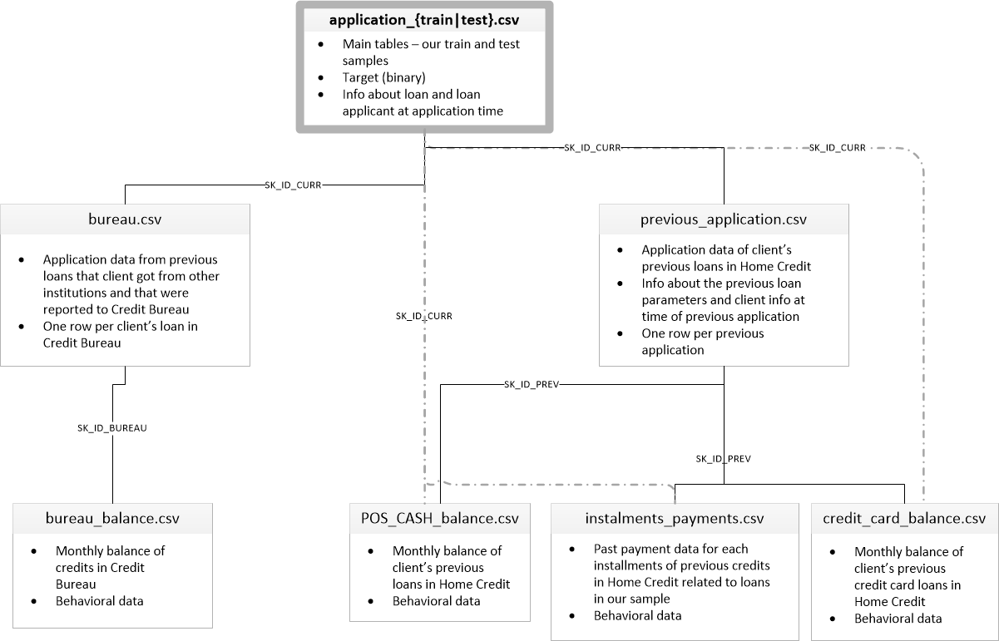

    * au lieu d'utiliser une base de données ou un simple fichier texte, le module pickle est fait pour ça. Il permet de stocker et de restaurer un objet Python tel quel sans aucune manipulation supplémentaire. C'est vraiment super pratique. Il fonctionne comme le module json mais n'est pas limité à un seul format d'objet.

In [2]:
#Global Variable
globalLevelDebug = 1 # Verbosity level for displaying execution tracking information for long runtime functions
globalRS = 1 # Random_State

In [4]:
#********************************** Calcule des valeurs nulles + pourcentage: ******************************
def calc_inf (df,line):
    
    # ****************** Définition des variabes************************************************************
    nb_line_nan = nb_line_mix = nb_line_ssna= nb_col_nan = nb_col_mix = nb_col_ssna = 0   
         
    #***************************************************** Les statistiques NaN par colonne*****************
    
    n_list = df.isnull().sum().tolist()
    for i in range(len(n_list)):
        if n_list[i] == 0:                     # Nombre de colonnes sans NaN
            nb_col_ssna += 1  
        elif n_list[i] == len(df):             # Nombre de colonnes nulles
            nb_col_nan += 1
        elif 0 < n_list[i] < len(df):          # Nombre de colonnes mixtes
            nb_col_mix += 1
    print("* Nombre de colonnes sans NaN ------------:",nb_col_ssna)
    print("* Nombre de colonnes NaN -----------------:", nb_col_nan)
    print("* Nombre de colonnes mixtes---------------:",nb_col_mix)
   # *************************************** Les statistiques NaN par ligne ********************************

    if line == True:
        for j in range(len(df.index)) :
            if df.iloc[j].isnull().sum() == len(df.columns):         # Nombre de lignes nulles
                nb_line_nan += 1
            elif 0 < df.iloc[j].isnull().sum() < len(df.columns):    # Nombre de lignes mixtes
                nb_line_mix += 1
            elif df.iloc[j].isnull().sum() == 0:                     # Nombre de lignes sans NaN
                nb_line_ssna += 1
        print("* Nombre de ligne entièrement nulles -:",nb_line_nan)  
        print("* Nombre de ligne mixtes -------------:", nb_line_mix) 
        print("* Nombre de ligne sans NaN -----------:", nb_line_ssna)
    #*******************************************************************************************************
    nb_line = df.index.size
    nb_colonne = df.columns.size
    tot = (nb_colonne*nb_line)
    nan = df.isnull().sum().sum()
    nan_prcnt = (100 * nan) / tot
    not_nan = df.notna().sum().sum()
    not_nan_prcnt = float((100 * not_nan) / tot)
    #*******************************************************************************************************
    
    print("* Nombre de lignes -----------------------: {:.0f}".format(nb_line))
    print("* Nombre de colonnes ---------------------: {:.0f}".format(nb_colonne))
    print("* Nombre de cases ------------------------: {:.0f}".format(tot))
    print("* Nombre de valeurs nulles ---------------: {:.0f}".format(nan))
    print("* Nombre de valeurs non nulles -----------: {:.0f}".format(not_nan))
    print("* le pourcentage des valeurs nulles ------:",str("%.1f" % nan_prcnt) + ' %')
    print("* le pourcentage des valeurs non nulles --:",str("%.1f" % not_nan_prcnt) + ' %')
    #a = pd.concat([not_nan_prcnt,nan_prcnt])
    # *******************************************************************************************************
    
    t= [not_nan_prcnt, nan_prcnt]
    plt.pie(t, labels = ['Valeurs non nulles', 
                         'Valeurs nulles (NaN)'],colors =['#11E5AD', 'red'],
            startangle = 90, shadow = True, explode =(0,0.1),
            autopct = "%1.1f%%", normalize = True)
    plt.title("Le taux de remplissage en %")
    plt.show()

In [5]:

# Load packages
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Transformations de variables
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, RobustScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline

# Metrics de ML
from sklearn.metrics import auc, roc_curve, roc_auc_score, make_scorer
from sklearn.metrics import precision_recall_curve

# Packages de cross_validation
from sklearn.model_selection import cross_val_score, cross_val_predict, StratifiedKFold
from sklearn.calibration import calibration_curve, CalibratedClassifierCV

# Modèles de ML
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.dummy import DummyClassifier
#from lightgbm import LGBMClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import ElasticNet
from xgboost import plot_importance

# Librairies graphiques
import plotly.offline as py
import plotly.graph_objs as go
import plotly.offline as offline
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Plot settings
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
sns.set()
pd.set_option('display.max_columns', None)
from pandas import MultiIndex, Int64Index

# 1. Description des données

In [6]:
app_test              = pd.read_csv('D:/Projet_Classrooms/Projet_07/application_test.csv')
app_train             = pd.read_csv('D:/Projet_Classrooms/Projet_07/application_train.csv')
bureau                = pd.read_csv('D:/Projet_Classrooms/Projet_07/bureau.csv')
bureau_blc            = pd.read_csv('D:/Projet_Classrooms/Projet_07/bureau_balance.csv')
credit_card_blc       = pd.read_csv('D:/Projet_Classrooms/Projet_07/credit_card_balance.csv')
HomeCredit_clmns_desc = pd.read_csv('D:/Projet_Classrooms/Projet_07/HomeCredit_columns_description.csv', encoding='cp1252')
inst_payments         = pd.read_csv('D:/Projet_Classrooms/Projet_07/installments_payments.csv')
POS_CASH_balance      = pd.read_csv('D:/Projet_Classrooms/Projet_07/POS_CASH_balance.csv')
previous_app          = pd.read_csv('D:/Projet_Classrooms/Projet_07/previous_application.csv')
sample_submission     = pd.read_csv('D:/Projet_Classrooms/Projet_07/sample_submission.csv')

##  Aperçu de Data-Sets

In [7]:
app_train.shape,app_test.shape

((307511, 122), (48744, 121))

In [8]:
app_test.head(2)

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.018850,-19241,-2329,-5170.0,-812,NaN,1,1,0,1,0,1,NaN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.752614,0.789654,0.159520,0.066,0.059,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0505,NaN,NaN,0.0672,0.0612,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0526,NaN,NaN,0.0666,0.059,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0514,NaN,NaN,NaN,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.035792,-18064,-4469,-9118.0,-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.564990,0.291656,0.432962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0


In [9]:
app_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB


In [10]:
app_train.head(2)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [11]:
app_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [12]:
bureau.head(2)

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN


In [13]:
bureau.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 17 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_CURR              int64  
 1   SK_ID_BUREAU            int64  
 2   CREDIT_ACTIVE           object 
 3   CREDIT_CURRENCY         object 
 4   DAYS_CREDIT             int64  
 5   CREDIT_DAY_OVERDUE      int64  
 6   DAYS_CREDIT_ENDDATE     float64
 7   DAYS_ENDDATE_FACT       float64
 8   AMT_CREDIT_MAX_OVERDUE  float64
 9   CNT_CREDIT_PROLONG      int64  
 10  AMT_CREDIT_SUM          float64
 11  AMT_CREDIT_SUM_DEBT     float64
 12  AMT_CREDIT_SUM_LIMIT    float64
 13  AMT_CREDIT_SUM_OVERDUE  float64
 14  CREDIT_TYPE             object 
 15  DAYS_CREDIT_UPDATE      int64  
 16  AMT_ANNUITY             float64
dtypes: float64(8), int64(6), object(3)
memory usage: 222.6+ MB


In [14]:
bureau_blc.head(2)

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C


In [15]:
bureau_blc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27299925 entries, 0 to 27299924
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   SK_ID_BUREAU    int64 
 1   MONTHS_BALANCE  int64 
 2   STATUS          object
dtypes: int64(2), object(1)
memory usage: 624.8+ MB


In [16]:
credit_card_blc.head(2)

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,1800.0,1800.0,0.00,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,2250.0,2250.0,60175.08,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0


In [17]:
credit_card_blc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3840312 entries, 0 to 3840311
Data columns (total 23 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   SK_ID_PREV                  int64  
 1   SK_ID_CURR                  int64  
 2   MONTHS_BALANCE              int64  
 3   AMT_BALANCE                 float64
 4   AMT_CREDIT_LIMIT_ACTUAL     int64  
 5   AMT_DRAWINGS_ATM_CURRENT    float64
 6   AMT_DRAWINGS_CURRENT        float64
 7   AMT_DRAWINGS_OTHER_CURRENT  float64
 8   AMT_DRAWINGS_POS_CURRENT    float64
 9   AMT_INST_MIN_REGULARITY     float64
 10  AMT_PAYMENT_CURRENT         float64
 11  AMT_PAYMENT_TOTAL_CURRENT   float64
 12  AMT_RECEIVABLE_PRINCIPAL    float64
 13  AMT_RECIVABLE               float64
 14  AMT_TOTAL_RECEIVABLE        float64
 15  CNT_DRAWINGS_ATM_CURRENT    float64
 16  CNT_DRAWINGS_CURRENT        int64  
 17  CNT_DRAWINGS_OTHER_CURRENT  float64
 18  CNT_DRAWINGS_POS_CURRENT    float64
 19  CNT_INSTALMENT_MATURE

In [18]:
inst_payments.head(2)

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525


In [19]:
inst_payments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13605401 entries, 0 to 13605400
Data columns (total 8 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   SK_ID_PREV              int64  
 1   SK_ID_CURR              int64  
 2   NUM_INSTALMENT_VERSION  float64
 3   NUM_INSTALMENT_NUMBER   int64  
 4   DAYS_INSTALMENT         float64
 5   DAYS_ENTRY_PAYMENT      float64
 6   AMT_INSTALMENT          float64
 7   AMT_PAYMENT             float64
dtypes: float64(5), int64(3)
memory usage: 830.4 MB


In [20]:
POS_CASH_balance.head(2)

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0


In [21]:
POS_CASH_balance.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001358 entries, 0 to 10001357
Data columns (total 8 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   SK_ID_PREV             int64  
 1   SK_ID_CURR             int64  
 2   MONTHS_BALANCE         int64  
 3   CNT_INSTALMENT         float64
 4   CNT_INSTALMENT_FUTURE  float64
 5   NAME_CONTRACT_STATUS   object 
 6   SK_DPD                 int64  
 7   SK_DPD_DEF             int64  
dtypes: float64(2), int64(5), object(1)
memory usage: 610.4+ MB


In [22]:
previous_app.head(2)

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0


In [23]:
previous_app.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [24]:
sample_submission.head(2)

,SK_ID_CURR,TARGET
0,100001,0.5
1,100005,0.5


In [25]:
sample_submission.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   SK_ID_CURR  48744 non-null  int64  
 1   TARGET      48744 non-null  float64
dtypes: float64(1), int64(1)
memory usage: 761.8 KB


In [26]:
HomeCredit_clmns_desc

,Unnamed: 0,Table,Row,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,Target variable (1 - client with payment diffi...,NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN
...,...,...,...,...,...
214,217,installments_payments.csv,NUM_INSTALMENT_NUMBER,On which installment we observe payment,NaN
215,218,installments_payments.csv,DAYS_INSTALMENT,When the installment of previous credit was su...,time only relative to the application
216,219,installments_payments.csv,DAYS_ENTRY_PAYMENT,When was the installments of previous credit p...,time only relative to the application
217,220,installments_payments.csv,AMT_INSTALMENT,What was the prescribed installment amount of ...,NaN


In [27]:
HomeCredit_clmns_desc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219 entries, 0 to 218
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Unnamed: 0   219 non-null    int64 
 1   Table        219 non-null    object
 2   Row          219 non-null    object
 3   Description  219 non-null    object
 4   Special      86 non-null     object
dtypes: int64(1), object(4)
memory usage: 8.7+ KB


## Informations générales sur les data-set: dimension, NaN ....

In [28]:
dict_ = {'app_test'             : app_test,
        'app_train'            : app_train,
        'bureau'               : bureau,
        'bureau_blc'           : bureau_blc,
        'credit_card_blc'      : credit_card_blc,
        'inst_payments'        : inst_payments,
        'POS_CASH_balance'     : POS_CASH_balance,
        'previous_app'         : previous_app,
        'sample_submission'    : sample_submission,
        'HomeCredit_clmns_desc': HomeCredit_clmns_desc
       }

******* app_test *******

* Nombre de colonnes sans NaN ------------: 57
* Nombre de colonnes NaN -----------------: 0
* Nombre de colonnes mixtes---------------: 64
* Nombre de lignes -----------------------: 48744
* Nombre de colonnes ---------------------: 121
* Nombre de cases ------------------------: 5898024
* Nombre de valeurs nulles ---------------: 1404419
* Nombre de valeurs non nulles -----------: 4493605
* le pourcentage des valeurs nulles ------: 23.8 %
* le pourcentage des valeurs non nulles --: 76.2 %


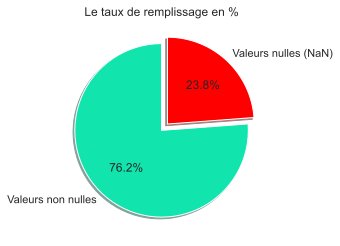

**************************************************************************************************** 

******* app_train *******

* Nombre de colonnes sans NaN ------------: 55
* Nombre de colonnes NaN -----------------: 0
* Nombre de colonnes mixtes---------------: 67
* Nombre de lignes -----------------------: 307511
* Nombre de colonnes ---------------------: 122
* Nombre de cases ------------------------: 37516342
* Nombre de valeurs nulles ---------------: 9152465
* Nombre de valeurs non nulles -----------: 28363877
* le pourcentage des valeurs nulles ------: 24.4 %
* le pourcentage des valeurs non nulles --: 75.6 %


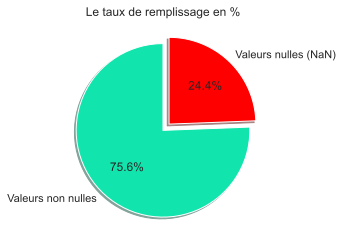

**************************************************************************************************** 

******* bureau *******

* Nombre de colonnes sans NaN ------------: 10
* Nombre de colonnes NaN -----------------: 0
* Nombre de colonnes mixtes---------------: 7
* Nombre de lignes -----------------------: 1716428
* Nombre de colonnes ---------------------: 17
* Nombre de cases ------------------------: 29179276
* Nombre de valeurs nulles ---------------: 3939947
* Nombre de valeurs non nulles -----------: 25239329
* le pourcentage des valeurs nulles ------: 13.5 %
* le pourcentage des valeurs non nulles --: 86.5 %


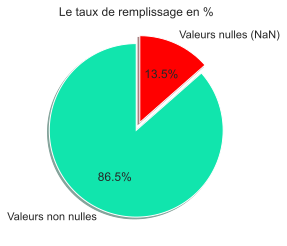

**************************************************************************************************** 

******* bureau_blc *******

* Nombre de colonnes sans NaN ------------: 3
* Nombre de colonnes NaN -----------------: 0
* Nombre de colonnes mixtes---------------: 0
* Nombre de lignes -----------------------: 27299925
* Nombre de colonnes ---------------------: 3
* Nombre de cases ------------------------: 81899775
* Nombre de valeurs nulles ---------------: 0
* Nombre de valeurs non nulles -----------: 81899775
* le pourcentage des valeurs nulles ------: 0.0 %
* le pourcentage des valeurs non nulles --: 100.0 %


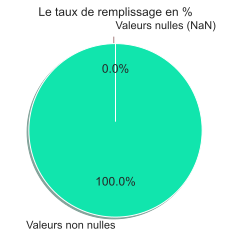

**************************************************************************************************** 

******* credit_card_blc *******

* Nombre de colonnes sans NaN ------------: 14
* Nombre de colonnes NaN -----------------: 0
* Nombre de colonnes mixtes---------------: 9
* Nombre de lignes -----------------------: 3840312
* Nombre de colonnes ---------------------: 23
* Nombre de cases ------------------------: 88327176
* Nombre de valeurs nulles ---------------: 5877356
* Nombre de valeurs non nulles -----------: 82449820
* le pourcentage des valeurs nulles ------: 6.7 %
* le pourcentage des valeurs non nulles --: 93.3 %


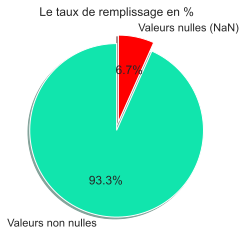

**************************************************************************************************** 

******* inst_payments *******

* Nombre de colonnes sans NaN ------------: 6
* Nombre de colonnes NaN -----------------: 0
* Nombre de colonnes mixtes---------------: 2
* Nombre de lignes -----------------------: 13605401
* Nombre de colonnes ---------------------: 8
* Nombre de cases ------------------------: 108843208
* Nombre de valeurs nulles ---------------: 5810
* Nombre de valeurs non nulles -----------: 108837398
* le pourcentage des valeurs nulles ------: 0.0 %
* le pourcentage des valeurs non nulles --: 100.0 %


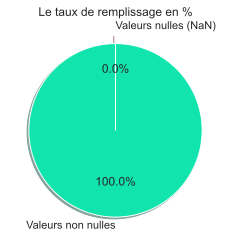

**************************************************************************************************** 

******* POS_CASH_balance *******

* Nombre de colonnes sans NaN ------------: 6
* Nombre de colonnes NaN -----------------: 0
* Nombre de colonnes mixtes---------------: 2
* Nombre de lignes -----------------------: 10001358
* Nombre de colonnes ---------------------: 8
* Nombre de cases ------------------------: 80010864
* Nombre de valeurs nulles ---------------: 52158
* Nombre de valeurs non nulles -----------: 79958706
* le pourcentage des valeurs nulles ------: 0.1 %
* le pourcentage des valeurs non nulles --: 99.9 %


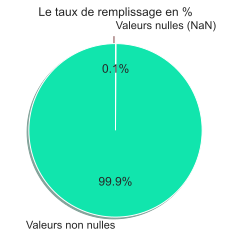

**************************************************************************************************** 

******* previous_app *******

* Nombre de colonnes sans NaN ------------: 21
* Nombre de colonnes NaN -----------------: 0
* Nombre de colonnes mixtes---------------: 16
* Nombre de lignes -----------------------: 1670214
* Nombre de colonnes ---------------------: 37
* Nombre de cases ------------------------: 61797918
* Nombre de valeurs nulles ---------------: 11109336
* Nombre de valeurs non nulles -----------: 50688582
* le pourcentage des valeurs nulles ------: 18.0 %
* le pourcentage des valeurs non nulles --: 82.0 %


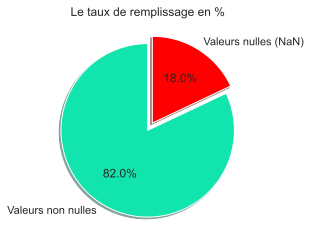

**************************************************************************************************** 

******* sample_submission *******

* Nombre de colonnes sans NaN ------------: 2
* Nombre de colonnes NaN -----------------: 0
* Nombre de colonnes mixtes---------------: 0
* Nombre de lignes -----------------------: 48744
* Nombre de colonnes ---------------------: 2
* Nombre de cases ------------------------: 97488
* Nombre de valeurs nulles ---------------: 0
* Nombre de valeurs non nulles -----------: 97488
* le pourcentage des valeurs nulles ------: 0.0 %
* le pourcentage des valeurs non nulles --: 100.0 %


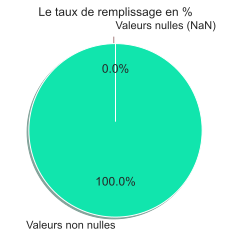

**************************************************************************************************** 

******* HomeCredit_clmns_desc *******

* Nombre de colonnes sans NaN ------------: 4
* Nombre de colonnes NaN -----------------: 0
* Nombre de colonnes mixtes---------------: 1
* Nombre de lignes -----------------------: 219
* Nombre de colonnes ---------------------: 5
* Nombre de cases ------------------------: 1095
* Nombre de valeurs nulles ---------------: 133
* Nombre de valeurs non nulles -----------: 962
* le pourcentage des valeurs nulles ------: 12.1 %
* le pourcentage des valeurs non nulles --: 87.9 %


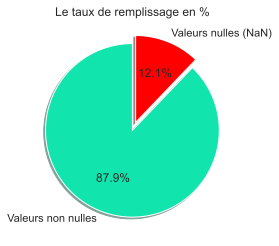

**************************************************************************************************** 



In [29]:
for tab_name, tab in dict_.items():
    print('*******',tab_name,'*******\n')
    calc_inf(tab, False)
    print("*"*100,'\n')

## Distribution des valeurs NaN par features

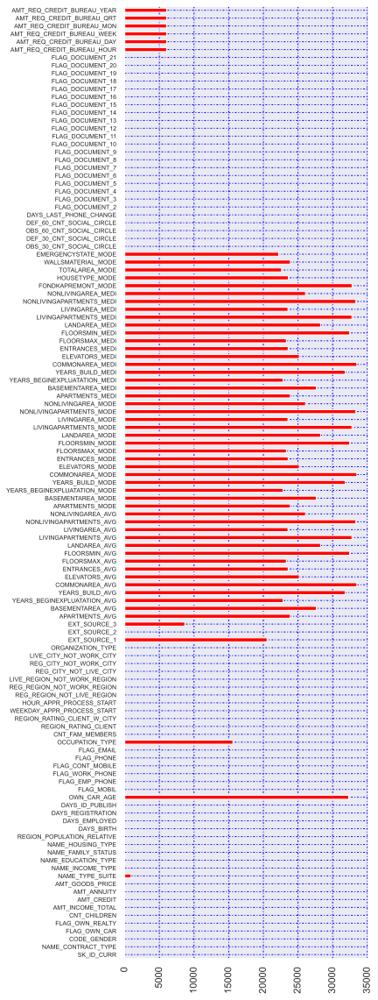

In [30]:
app_test.isna().sum().plot(kind = 'barh',color = 'red',figsize=(5,20))
plt.xticks(rotation=90)
plt.yticks(rotation=0,fontsize=7)
plt.grid(True, color='blue', dashes=(2,2,1,2))

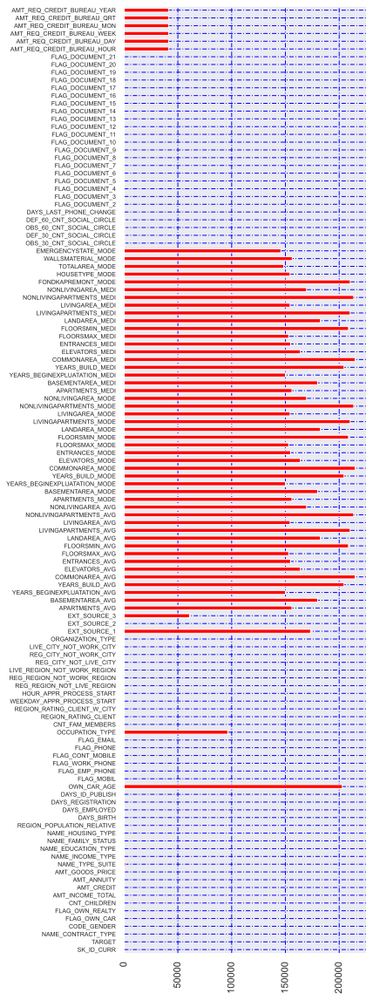

In [31]:
#app_train,bureau,credit_card_blc,POS_CASH_balance,previous_app]
app_train.isna().sum().plot(kind = 'barh',color = 'red',figsize=(5,20))
plt.xticks(rotation=90)
plt.yticks(rotation=0,fontsize=7)
plt.grid(True, color='blue', dashes=(5,2,1,2))


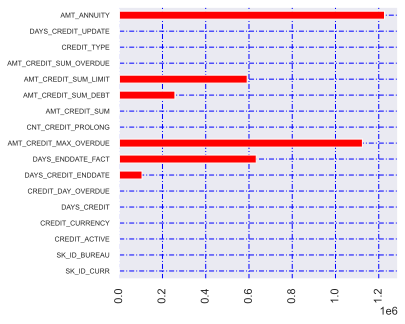

In [32]:
#app_train,bureau,credit_card_blc,POS_CASH_balance,previous_app]
bureau.isna().sum().plot(kind = 'barh',color = 'red',figsize=(5,5))
plt.xticks(rotation=90)
plt.yticks(rotation=0,fontsize=7)
plt.grid(True, color='blue', dashes=(5,2,1,2))

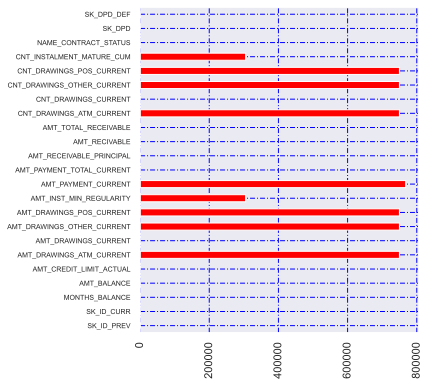

In [33]:
#app_train,bureau,credit_card_blc,POS_CASH_balance,previous_app]
credit_card_blc.isna().sum().plot(kind = 'barh',color = 'red',figsize=(5,6))
plt.xticks(rotation=90)
plt.yticks(rotation=0,fontsize=7)
plt.grid(True, color='blue', dashes=(5,2,1,2))

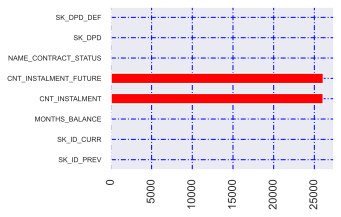

In [34]:
#app_train,bureau,credit_card_blc,POS_CASH_balance,previous_app]
POS_CASH_balance.isna().sum().plot(kind = 'barh',color = 'red',figsize=(4,3))
plt.xticks(rotation=90)
plt.yticks(rotation=0,fontsize=7)
plt.grid(True, color='blue', dashes=(5,2,1,2))

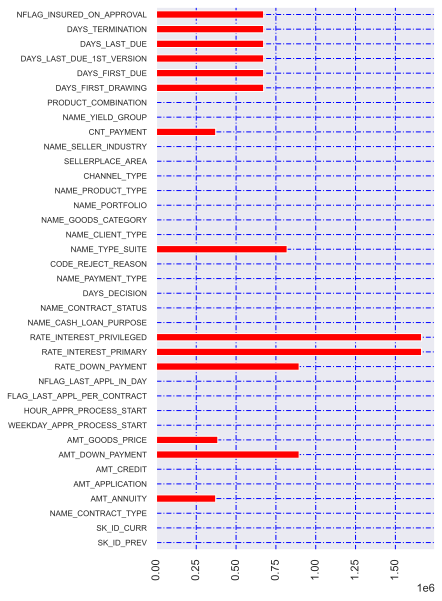

In [35]:
#app_train,bureau,credit_card_blc,POS_CASH_balance,previous_app]
previous_app.isna().sum().plot(kind = 'barh',color = 'red',figsize=(5,10))
plt.xticks(rotation=90)
plt.yticks(rotation=0,fontsize=8)
plt.grid(True, color='blue', dashes=(5,2,1,2))

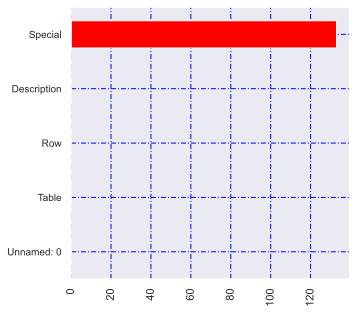

In [36]:
#app_train,bureau,credit_card_blc,POS_CASH_balance,previous_app]
HomeCredit_clmns_desc.isna().sum().plot(kind = 'barh',color = 'red',figsize=(5,5))
plt.xticks(rotation=90)
plt.yticks(rotation=0,fontsize=10)
plt.grid(True, color='blue', dashes=(5,2,1,2))

## Exploratory Data Analysis app_train, app_test

## Target ....

    * 0 prêt remboursé sans problème
    * 1 prêt non remboursé

In [37]:
def pie_pc(df):
    target_values = df.value_counts()/len(df)*100
    
    fig, axes = plt.subplots(figsize=(8,4), nrows = 1,ncols = 2)
    plt.tight_layout()
    
    axes[1].set_title("% des prêt remboursés et non remboursés")
    #axes[1].set_xlabel('X')
    #axes[1].set_ylabel('X Squared')
    axes[1].pie(target_values, labels = ['Prêt remboursé', 'Prêt non remboursé'],
            colors =['#11E5AD', 'red'],
            startangle = 90, 
            shadow = True, 
            explode =(0,0.1), 
            autopct = "%2.1f%%", 
            normalize = True)
    
    axes[0].hist(app_train['TARGET'].astype(int), color='red')
    axes[0].set_title('TARGET ANALYSIS')
    axes[0].set_xlabel('TARGET')
    axes[0].set_ylabel('NUMBER OF CUSTOMERS')


In [38]:
app_train['TARGET'].isnull().sum()

0

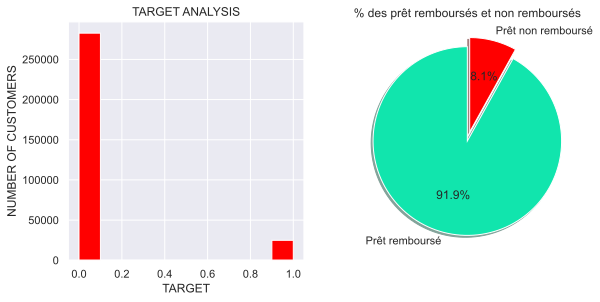

In [39]:
pie_pc(app_train['TARGET'])

   
    * Comme présenté au dessus dans le pie. Il y a beaucoup plus de prêts remboursés à temps que de prêts non remboursés.
    * Lorsque nous utiliserons des modèles d'apprentissage automatique plus sophistiqués, nous pourrons pondérer les classes en fonction de leur représentation dans les données afin de refléter ce déséquilibre.

In [40]:
print('La taille de app_train:', app_train.shape)
print('La taille de app_test :', app_test.shape)

La taille de app_train: (307511, 122)
La taille de app_test : (48744, 121)


## Type de variables 

In [41]:
list_col_train =[]
for col in app_train.columns:
    list_col_train.append(col)

In [42]:
for col in list_col_train:
    print(str(col), app_train[col].dtype)

SK_ID_CURR int64
TARGET int64
NAME_CONTRACT_TYPE object
CODE_GENDER object
FLAG_OWN_CAR object
FLAG_OWN_REALTY object
CNT_CHILDREN int64
AMT_INCOME_TOTAL float64
AMT_CREDIT float64
AMT_ANNUITY float64
AMT_GOODS_PRICE float64
NAME_TYPE_SUITE object
NAME_INCOME_TYPE object
NAME_EDUCATION_TYPE object
NAME_FAMILY_STATUS object
NAME_HOUSING_TYPE object
REGION_POPULATION_RELATIVE float64
DAYS_BIRTH int64
DAYS_EMPLOYED int64
DAYS_REGISTRATION float64
DAYS_ID_PUBLISH int64
OWN_CAR_AGE float64
FLAG_MOBIL int64
FLAG_EMP_PHONE int64
FLAG_WORK_PHONE int64
FLAG_CONT_MOBILE int64
FLAG_PHONE int64
FLAG_EMAIL int64
OCCUPATION_TYPE object
CNT_FAM_MEMBERS float64
REGION_RATING_CLIENT int64
REGION_RATING_CLIENT_W_CITY int64
WEEKDAY_APPR_PROCESS_START object
HOUR_APPR_PROCESS_START int64
REG_REGION_NOT_LIVE_REGION int64
REG_REGION_NOT_WORK_REGION int64
LIVE_REGION_NOT_WORK_REGION int64
REG_CITY_NOT_LIVE_CITY int64
REG_CITY_NOT_WORK_CITY int64
LIVE_CITY_NOT_WORK_CITY int64
ORGANIZATION_TYPE object
EXT_SOUR

## Variables numériques

In [43]:
list_app = [app_test,app_train, bureau,bureau_blc,credit_card_blc, inst_payments, 
            POS_CASH_balance,previous_app,sample_submission,HomeCredit_clmns_desc]
    
for app in list_app:
    display(app.describe())

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,48744.000000,48744.000000,4.874400e+04,4.874400e+04,48720.000000,4.874400e+04,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,16432.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,28212.000000,48736.000000,40076.000000,24857.000000,21103.000000,25888.000000,16926.000000,15249.000000,23555.000000,25165.000000,25423.000000,16278.000000,20490.000000,15964.000000,25192.000000,15397.000000,22660.000000,24857.000000,21103.000000,25888.000000,16926.000000,15249.000000,23555.000000,25165.000000,25423.000000,16278.000000,20490.000000,15964.000000,25192.000000,15397.000000,22660.000000,24857.000000,21103.000000,25888.000000,16926.000000,15249.000000,23555.000000,25165.000000,25423.000000,16278.000000,20490.000000,15964.000000,25192.000000,15397.000000,22660.000000,26120.000000,48715.000000,48715.000000,48715.000000,48715.000000,48744.000000,48744.0,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.0,48744.000000,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.000000,48744.0,48744.0,48744.0,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000
mean,277796.676350,0.397054,1.784318e+05,5.167404e+05,29426.240209,4.626188e+05,0.021226,-16068.084605,67485.366322,-4967.652716,-3051.712949,11.786027,0.999979,0.809720,0.204702,0.998400,0.263130,0.162646,2.146767,2.038159,2.012596,12.007365,0.018833,0.055166,0.042036,0.077466,0.224664,0.174216,0.501180,0.518021,0.500106,0.122388,0.090065,0.978828,0.751137,0.047624,0.085168,0.151777,0.233706,0.238423,0.067192,0.105885,0.112286,0.009231,0.029387,0.119078,0.088998,0.978292,0.758327,0.045223,0.080570,0.147161,0.229390,0.233854,0.065914,0.110874,0.110687,0.008358,0.028161,0.122809,0.089529,0.978822,0.754344,0.047420,0.084128,0.151200,0.233154,0.237846,0.068069,0.107063,0.113368,0.008979,0.029296,0.107129,1.447644,0.143652,1.435738,0.101139,-1077.766228,0.0,0.786620,

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,134133.000000,3.068510e+05,246546.000000,151450.00000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,159080.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,12.061091,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,2.152665,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,0.502130,5.143927e-01,0.510853,0.11744,0.088442,0.977735,0.752471,0.044621,0.078942,0.149725,0.226282,0.231894,0.066333,0.100775,0.107399,0.008809,0.028358,0.114231,0.087543,0.977065,0.759637,0.042553,0.074490,0.145193,0.222315,0.228058,0.064958,0.105645,0.105975,0.008076,0.027022,0.117850,0.087955,0.97

,SK_ID_CURR,SK_ID_BUREAU,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
count,1.716428e+06,1.716428e+06,1.716428e+06,1.716428e+06,1.610875e+06,1.082775e+06,5.919400e+05,1.716428e+06,1.716415e+06,1.458759e+06,1.124648e+06,1.716428e+06,1.716428e+06,4.896370e+05
mean,2.782149e+05,5.924434e+06,-1.142108e+03,8.181666e-01,5.105174e+02,-1.017437e+03,3.825418e+03,6.410406e-03,3.549946e+05,1.370851e+05,6.229515e+03,3.791276e+01,-5.937483e+02,1.571276e+04
std,1.029386e+05,5.322657e+05,7.951649e+02,3.654443e+01,4.994220e+03,7.140106e+02,2.060316e+05,9.622391e-02,1.149811e+06,6.774011e+05,4.503203e+04,5.937650e+03,7.207473e+02,3.258269e+05
min,1.000010e+05,5.000000e+06,-2.922000e+03,0.000000e+00,-4.206000e+04,-4.202300e+04,0.000000e+00,0.000000e+00,0.000000e+00,-4.705600e+06,-5.864061e+05,0.000000e+00,-4.194700e+04,0.000000e+00
25%,1.888668e+05,5.463954e+06,-1.666000e+03,0.000000e+00,-1.138000e+03,-1.489000e+03,0.000000e+00,0.000000e+00,5.130000e+04,0.000000e+00,0.000000e+00,0.000000e+00,-9.080000e+02,0.000000e+00
50%,2.780550e+05,5.926304e+06,-9.870000e+02,0.000000e+00,-3.300000e+02,-8.970000e+02,0.000000e+00,0.000000e+00,1.255185e+05,0.000000e+00,0.000000e+00,0.000000e+00,-3.950000e+02,0.000000e+00
75%,3.674260e+05,6.385681e+06,-4.740000e+02,0.000000e+00,4.740000e+02,-4.250000e+02,0.000000e+00,0.000000e+00,3.150000e+05,4.015350e+04,0.000000e+00,0.000000e+00,-3.300000e+01,1.350000e+04
max,4.562550e+05,6.843457e+06,0.000000e+00,2.792000e+03,3.119900e+04,0.000000e+00,1.159872e+08,9.000000e+00,5.850000e+08,1.701000e+08,4.705600e+06,3.756681e+06,3.720000e+02,1.184534e+08


,SK_ID_BUREAU,MONTHS_BALANCE
count,2.729992e+07,2.729992e+07
mean,6.036297e+06,-3.074169e+01
std,4.923489e+05,2.386451e+01
min,5.001709e+06,-9.600000e+01
25%,5.730933e+06,-4.600000e+01
50%,6.070821e+06,-2.500000e+01
75%,6.431951e+06,-1.100000e+01
max,6.842888e+06,0.000000e+00


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,SK_DPD,SK_DPD_DEF
count,3.840312e+06,3.840312e+06,3.840312e+06,3.840312e+06,3.840312e+06,3.090496e+06,3.840312e+06,3.090496e+06,3.090496e+06,3.535076e+06,3.072324e+06,3.840312e+06,3.840312e+06,3.840312e+06,3.840312e+06,3.090496e+06,3.840312e+06,3.090496e+06,3.090496e+06,3.535076e+06,3.840312e+06,3.840312e+06
mean,1.904504e+06,2.783242e+05,-3.452192e+01,5.830016e+04,1.538080e+05,5.961325e+03,7.433388e+03,2.881696e+02,2.968805e+03,3.540204e+03,1.028054e+04,7.588857e+03,5.596588e+04,5.808881e+04,5.809829e+04,3.094490e-01,7.031439e-01,4.812496e-03,5.594791e-01,2.082508e+01,9.283667e+00,3.316220e-01
std,5.364695e+05,1.027045e+05,2.666775e+01,1.063070e+05,1.651457e+05,2.822569e+04,3.384608e+04,8.201989e+03,2.079689e+04,5.600154e+03,3.607808e+04,3.200599e+04,1.025336e+05,1.059654e+05,1.059718e+05,1.100401e+00,3.190347e+00,8.263861e-02,3.240649e+00,2.005149e+01,9.751570e+01,2.147923e+01
min,1.000018e+06,1.000060e+05,-9.600000e+01,-4.202502e+05,0.000000e+00,-6.827310e+03,-6.211620e+03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-4.233058e+05,-4.202502e+05,-4.202502e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.434385e+06,1.895170e+05,-5.500000e+01,0.000000e+00,4.500000e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.523700e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00,0.000000e+00,0.000000e+00
50%,1.897122e+06,2.783960e+05,-2.800000e+01,0.000000e+00,1.125000e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.702700e+03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.500000e+01,0.000000e+00,0.000000e+00
75%,2.369328e+06,3.675800e+05,-1.100000e+01,8.904669e+04,1.800000e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,6.633911e+03,9.000000e+03,6.750000e+03,8.535924e+04,8.889949e+04,8.891451e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.200000e+01,0.000000e+00,0.000000e+00
max,2.843496e+06,4.562500e+05,-1.000000e+00,1.505902e+06,1.350000e+06,2.115000e+06,2.287098e+06,1.529847e+06,2.239274e+06,2.028820e+05,4.289207e+06,4.278316e+06,1.472317e+06,1.493338e+06,1.493338e+06,5.100000e+01,1.650000e+02,1.200000e+01,1.650000e+02,1.200000e+02,3.260000e+03,3.260000e+03


,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
count,1.360540e+07,1.360540e+07,1.360540e+07,1.360540e+07,1.360540e+07,1.360250e+07,1.360540e+07,1.360250e+07
mean,1.903365e+06,2.784449e+05,8.566373e-01,1.887090e+01,-1.042270e+03,-1.051114e+03,1.705091e+04,1.723822e+04
std,5.362029e+05,1.027183e+05,1.035216e+00,2.666407e+01,8.009463e+02,8.005859e+02,5.057025e+04,5.473578e+04
min,1.000001e+06,1.000010e+05,0.000000e+00,1.000000e+00,-2.922000e+03,-4.921000e+03,0.000000e+00,0.000000e+00
25%,1.434191e+06,1.896390e+05,0.000000e+00,4.000000e+00,-1.654000e+03,-1.662000e+03,4.226085e+03,3.398265e+03
50%,1.896520e+06,2.786850e+05,1.000000e+00,8.000000e+00,-8.180000e+02,-8.270000e+02,8.884080e+03,8.125515e+03
75%,2.369094e+06,3.675300e+05,1.000000e+00,1.900000e+01,-3.610000e+02,-3.700000e+02,1.671021e+04,1.610842e+04
max,2.843499e+06,4.562550e+05,1.780000e+02,2.770000e+02,-1.000000e+00,-1.000000e+00,3.771488e+06,3.771488e+06


,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,SK_DPD,SK_DPD_DEF
count,1.000136e+07,1.000136e+07,1.000136e+07,9.975287e+06,9.975271e+06,1.000136e+07,1.000136e+07
mean,1.903217e+06,2.784039e+05,-3.501259e+01,1.708965e+01,1.048384e+01,1.160693e+01,6.544684e-01
std,5.358465e+05,1.027637e+05,2.606657e+01,1.199506e+01,1.110906e+01,1.327140e+02,3.276249e+01
min,1.000001e+06,1.000010e+05,-9.600000e+01,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.434405e+06,1.895500e+05,-5.400000e+01,1.000000e+01,3.000000e+00,0.000000e+00,0.000000e+00
50%,1.896565e+06,2.786540e+05,-2.800000e+01,1.200000e+01,7.000000e+00,0.000000e+00,0.000000e+00
75%,2.368963e+06,3.674290e+05,-1.300000e+01,2.400000e+01,1.400000e+01,0.000000e+00,0.000000e+00
max,2.843499e+06,4.562550e+05,-1.000000e+00,9.200000e+01,8.500000e+01,4.231000e+03,3.595000e+03


,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1.297979e+06,1.670214e+06,1.670213e+06,7.743700e+05,1.284699e+06,1.670214e+06,1.670214e+06,774370.000000,5951.000000,5951.000000,1.670214e+06,1.670214e+06,1.297984e+06,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,1.923089e+06,2.783572e+05,1.595512e+04,1.752339e+05,1.961140e+05,6.697402e+03,2.278473e+05,1.248418e+01,9.964675e-01,0.079637,0.188357,0.773503,-8.806797e+02,3.139511e+02,1.605408e+01,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,5.325980e+05,1.028148e+05,1.478214e+04,2.927798e+05,3.185746e+05,2.092150e+04,3.153966e+05,3.334028e+00,5.932963e-02,0.107823,0.087671,0.100879,7.790997e+02,7.127443e+03,1.456729e+01,88916.115834,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,-0.000015,0.034781,0.373150,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.461857e+06,1.893290e+05,6.321780e+03,1.872000e+04,2.416050e+04,0.000000e+00,5.084100e+04,1.000000e+01,1.000000e+00,0.000000,0.160716,0.715645,-1.300000e+03,-1.000000e+00,6.000000e+00,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,1.923110e+06,2.787145e+05,1.125000e+04,7.104600e+04,8.054100e+04,1.638000e+03,1.123200e+05,1.200000e+01,1.000000e+00,0.051605,0.189122,0.835095,-5.810000e+02,3.000000e+00,1.200000e+01,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,2.384280e+06,3.675140e+05,2.065842e+04,1.803600e+05,2.164185e+05,7.740000e+03,2.340000e+05,1.500000e+01,1.000000e+00,0.108909,0.193330,0.852537,-2.800000e+02,8.200000e+01,2.400000e+01,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000
max,2.845382e+06,4.562550e+05,4.180581e+05,6.905160e+06,6.905160e+06,3.060045e+06,6.905160e+06,2.300000e+01,1.000000e+00,1.000000,1.000000,1.000000,-1.000000e+00,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


,SK_ID_CURR,TARGET
count,48744.000000,48744.0
mean,277796.676350,0.5
std,103169.547296,0.0
min,100001.000000,0.5
25%,188557.750000,0.5
50%,277549.000000,0.5
75%,367555.500000,0.5
max,456250.000000,0.5


,Unnamed: 0
count,219.000000
mean,111.981735
std,63.395726
min,1.000000
25%,57.500000
50%,112.000000
75%,166.500000
max,221.000000


In [44]:
#for col in app_train.select_dtypes(['int64', 'float64']).columns:
    #dis_nan_org = data_flt[col].values
   # sns.histplot(app_train[col], color= 'blue', kde=True)
   ## mean = app_train[col].mean()
   ### plt.axvline(mean, 0, 1, color='red')
    ####plt.title('Distribution de : '+ col)
    #####plt.show()

## Variables catégorielles

In [45]:
list_app_2 = [app_test,app_train, bureau,bureau_blc,credit_card_blc,  
            POS_CASH_balance,previous_app,HomeCredit_clmns_desc]
for app in list_app_2:
    display(app.describe(include = 'object'))


,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
count,48744,48744,48744,48744,47833,48744,48744,48744,48744,33139,48744,48744,15947,25125,24851,26535
unique,2,2,2,2,7,7,5,5,6,18,7,58,4,3,7,2
top,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Laborers,TUESDAY,Business Entity Type 3,reg oper account,block of flats,Panel,No
freq,48305,32678,32311,33658,39727,24533,33988,32283,43645,8655,9751,10840,12124,24659,11269,26179


,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
count,307511,307511,307511,307511,306219,307511,307511,307511,307511,211120,307511,307511,97216,153214,151170,161756
unique,2,3,2,2,7,8,5,6,6,18,7,58,4,3,7,2
top,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Laborers,TUESDAY,Business Entity Type 3,reg oper account,block of flats,Panel,No
freq,278232,202448,202924,213312,248526,158774,218391,196432,272868,55186,53901,67992,73830,150503,66040,159428


,CREDIT_ACTIVE,CREDIT_CURRENCY,CREDIT_TYPE
count,1716428,1716428,1716428
unique,4,4,15
top,Closed,currency 1,Consumer credit
freq,1079273,1715020,1251615


,STATUS
count,27299925
unique,8
top,C
freq,13646993


,NAME_CONTRACT_STATUS
count,3840312
unique,7
top,Active
freq,3698436


,NAME_CONTRACT_STATUS
count,10001358
unique,9
top,Active
freq,9151119


,NAME_CONTRACT_TYPE,WEEKDAY_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,NAME_SELLER_INDUSTRY,NAME_YIELD_GROUP,PRODUCT_COMBINATION
count,1670214,1670214,1670214,1670214,1670214,1670214,1670214,849809,1670214,1670214,1670214,1670214,1670214,1670214,1670214,1669868
unique,4,7,2,25,4,4,9,7,4,28,5,3,8,11,5,17
top,Cash loans,TUESDAY,Y,XAP,Approved,Cash through the bank,XAP,Unaccompanied,Repeater,XNA,POS,XNA,Credit and cash offices,XNA,XNA,Cash
freq,747553,255118,1661739,922661,1036781,1033552,1353093,508970,1231261,950809,691011,1063666,719968,855720,517215,285990


,Table,Row,Description,Special
count,219,219,219,86
unique,7,196,163,7
top,application_{train|test}.csv,SK_ID_CURR,Normalized information about building where th...,normalized
freq,122,6,47,53


## Distribution des variables catégorielles pour app_test et app_train
    

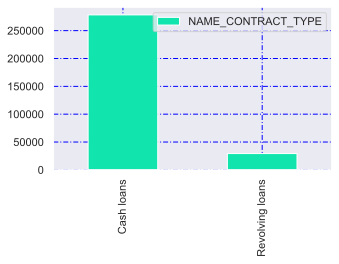

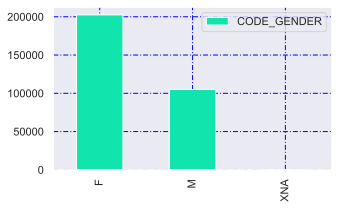

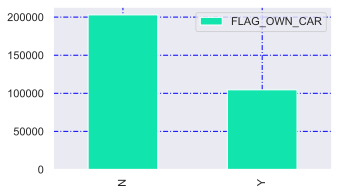

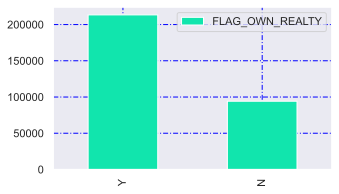

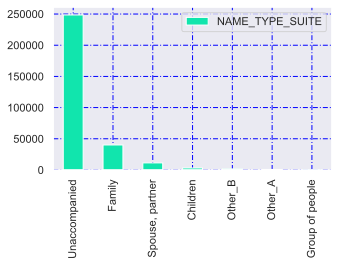

...

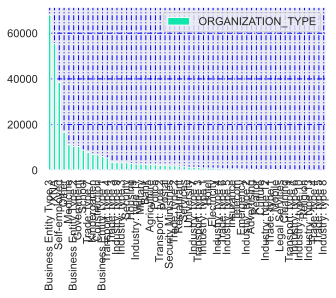

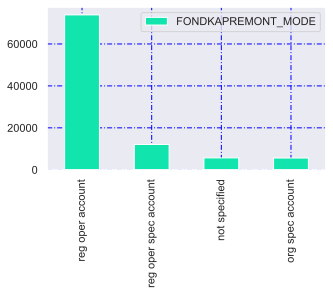

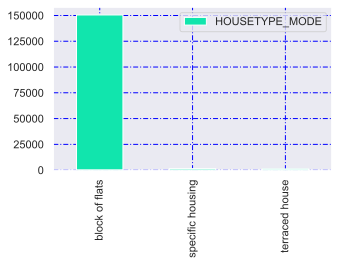

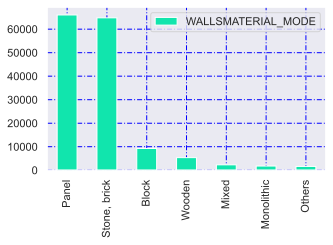

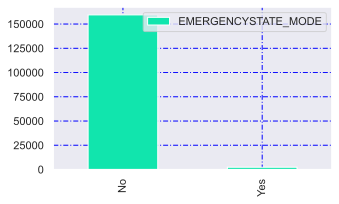

In [46]:
import seaborn as sns
for col in app_train.select_dtypes(['object']).columns:
   
    x = pd.DataFrame(app_train[col].value_counts())
    x.plot(kind = 'bar',color = '#11E5AD',figsize=(5,3))
    plt.grid(True, color='blue', dashes=(5,2,1,2))

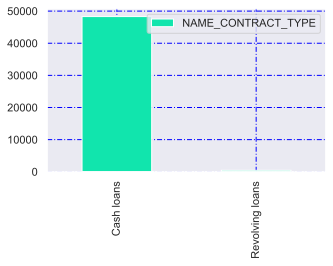

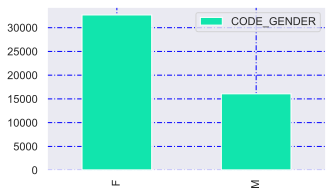

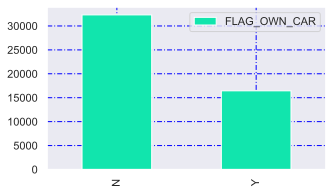

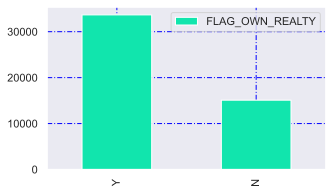

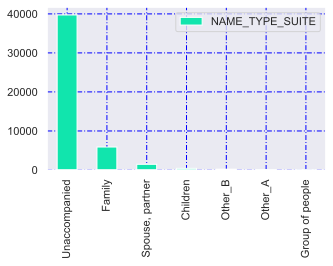

...

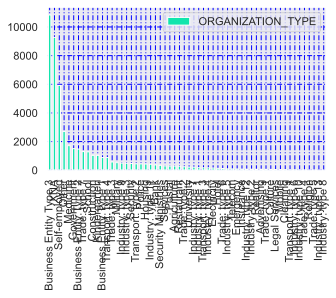

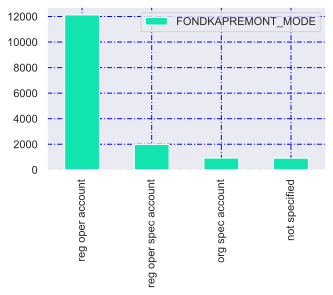

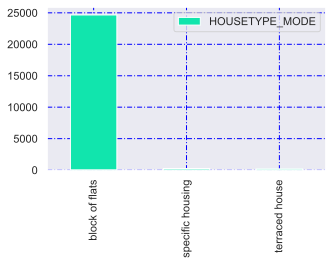

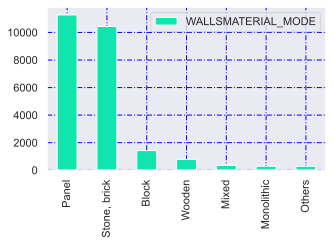

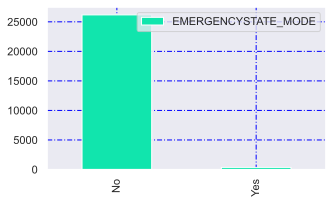

In [47]:
for col in app_test.select_dtypes(['object']).columns:
    x = pd.DataFrame(app_test[col].value_counts())
    x.plot(kind = 'bar',color = '#11E5AD',figsize=(5,3))
    plt.grid(True, color='blue', dashes=(5,2,1,2))

## Valeurs manquantes
    * 

In [48]:
#************************************ Valeurs manquantes et pourcentage en tableau % **************************************

def mssng_val(df):
    mssng_t = pd.DataFrame(columns=['Variable_name', 'Missing_values', 'Missing_rate'])
    mssng_t['Variable_name'] = df.columns
    
    missing = list()
    percentage_missing = list()
    
    for col in df.columns:
        nb_missing = df[col].isna().sum()                  # le nombre des valeurs NaN par colonne
        pc_missing = df[col].isna().sum()/df[col].size     # le pourcentage des valeurs NaN par colonne
        
        missing.append(nb_missing)
        percentage_missing.append(pc_missing)
        
    mssng_t['Missing_values'] = list(missing)
    mssng_t['Missing_rate'] = list(percentage_missing)
    mssng_t = mssng_t.sort_values(by= ['Missing_values'], ascending = False)
    return mssng_t

In [49]:
nan_data_tr= mssng_val(app_train)
nan_data_tr.T

,76,48,62,70,56,84,86,68,54,82,52,66,80,75,61,47,21,81,67,53,73,45,59,41,71,57,85,77,49,63,89,72,44,58,78,50,64,55,69,83,87,65,79,51,60,74,46,88,90,28,43,116,117,118,119,120,121,11,91,92,93,94,42,10,9,29,95,6,102,2,3,4,96,97,98,99,100,101,103,115,104,105,5,107,108,109,110,111,112,113,114,106,8,7,26,39,38,1,37,36,35,34,33,32,31,30,27,25,40,24,23,22,20,19,18,17,16,15,14,13,12,0
Variable_name,COMMONAREA_MEDI,COMMONAREA_AVG,COMMONAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAPARTMENTS_AVG,NONLIVINGAPARTMENTS_MEDI,FONDKAPREMONT_MODE,LIVINGAPARTMENTS_MODE,LIVINGAPARTMENTS_AVG,LIVINGAPARTMENTS_MEDI,FLOORSMIN_AVG,FLOORSMIN_MODE,FLOORSMIN_MEDI,YEARS_BUILD_MEDI,YEARS_BUILD_MODE,YEARS_BUILD_AVG,OWN_CAR_AGE,LANDAREA_MEDI,LANDAREA_MODE,LANDAREA_AVG,BASEMENTAREA_MEDI,BASEMENTAREA_AVG,BASEMENTAREA_MODE,EXT_SOURCE_1,NONLIVINGAREA_MODE,NONLIVINGAREA_AVG,NONLIVINGAREA_MEDI,ELEVATORS_MEDI,ELEVATORS_AVG,ELEVATORS_MODE,WALLSMATERIAL_MODE,APARTMENTS_MEDI,APARTMENTS_AVG,APARTMENTS_MODE,ENTRANCES_MEDI,ENTRANCES_AVG,ENTRANCES_MODE,LIVINGAREA_AVG,LIVINGAREA_MODE,LIVINGAREA_MEDI,HOUSETYPE_MODE,FLOORSMAX_MODE,FLOORSMAX_MEDI,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BEGINEXPLUATATION_AVG,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OCCUPATION_TYPE,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_TYPE_SUITE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,EXT_SOURCE_2,AMT_GOODS_PRICE,AMT_ANNUITY,CNT_FAM_MEMBERS,DAYS_LAST_PHONE_CHANGE,CNT_CHILDREN,FLAG_DOCUMENT_8,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_9,FLAG_DOCUMENT_21,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_OWN_REALTY,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_12,AMT_CREDIT,AMT_INCOME_TOTAL,FLAG_PHONE,LIVE_CITY_NOT_WORK_CITY,REG_CITY_NOT_WORK_CITY,TARGET,REG_CITY_NOT_LIVE_CITY,LIVE_REGION_NOT_WORK_REGION,REG_REGION_NOT_WORK_REGION,REG_REGION_NOT_LIVE_REGION,HOUR_APPR_PROCESS_START,WEEKDAY_APPR_PROCESS_START,REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT,FLAG_EMAIL,FLAG_CONT_MOBILE,ORGANIZATION_TYPE,FLAG_WORK_PHONE,FLAG_EMP_PHONE,FLAG_MOBIL,DAYS_ID_PUBLISH,DAYS_REGISTRATION,DAYS_EMPLOYED,DAYS_BIRTH,REGION_POPULATION_RELATIVE,NAME_HOUSING_TYPE,NAME_FAMILY_STATUS,NAME_EDUCATION_TYPE,NAME_INCOME_TYPE,SK_ID_CURR
Missing_values,214865,214865,214865,213514,213514,213514,210295,210199,210199,210199,208642,208642,208642,204488,204488,204488,202929,182590,182590,182590,179943,179943,179943,173378,169682,169682,169682,163891,163891,163891,156341,156061,156061,156061,154828,154828,154828,154350,154350,154350,154297,153020,153020,153020,150007,150007,150007,148431,145755,96391,60965,41519,41519,41519,41519,41519,41519,1292,1021,1021,1021,1021,660,278,12,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Missing_rate,0.698723,0.698723,0.698723,0.69433,0.69433,0.69433,0.683862,0.68355,0.68355,0.68355,0.678486,0.678486,0.678486,0.664978,0.664978,0.664978,0.659908,0.593767,0.593767,0.593767,0.58516,0.58516,0.58516,0.563811,0.551792,0.551792,0.551792,0.53296,0.53296,0.53296,0.508408,0.507497,0.507497,0.507497,0.503488,0.503488,0.503488,0.501933,0.501933,0.501933,0.501761,0.497608,0.497608,0.497608,0.48781,0.48781,0.48781,0.482685,0.473983,0.313455,0.198253,0.135016,0.135016,0.135016,0.135016,0.135016,0.135016,0.004201,0.00332,0.00332,0.00332,0.00332,0.002146,0.000904,0.000039,0.000007,0.000003,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


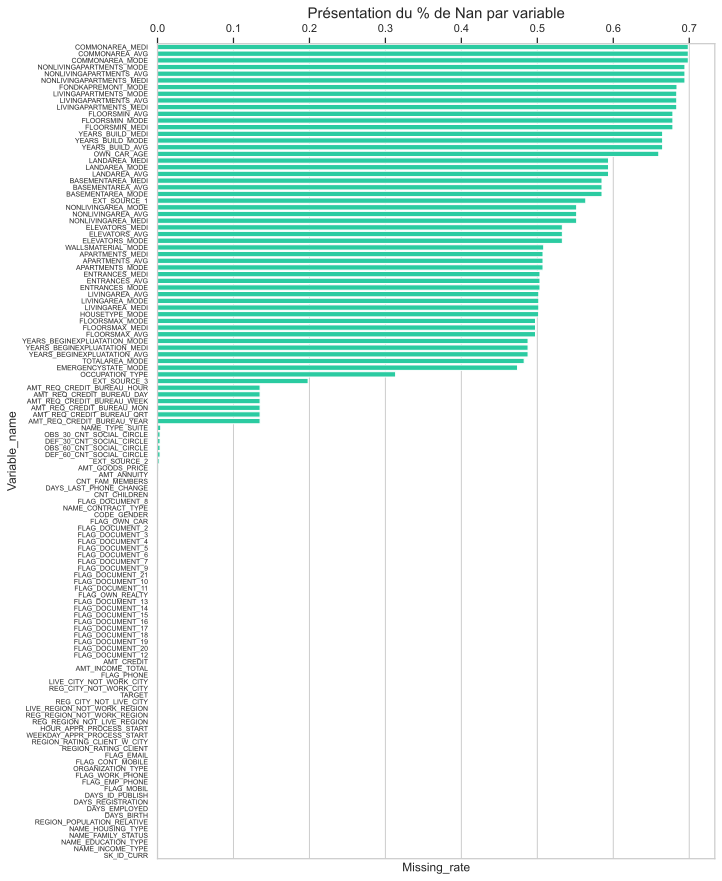

In [50]:
sns.set(style="whitegrid")
plt.figure(figsize=(10, 15))
ax = sns.barplot(x = nan_data_tr['Missing_rate'], y = nan_data_tr['Variable_name'], orient = 'h',color = '#11E5AD' )
ax.xaxis.set_ticks_position('top')
plt.yticks(rotation=0,fontsize=7)
plt.title('Présentation du % de Nan par variable', size=15)
plt.show()

In [52]:
nan_data_ts= mssng_val(app_test)
nan_data_ts.T

,47,61,75,55,69,83,85,53,67,81,79,51,65,20,46,74,60,80,52,66,72,44,58,56,70,84,62,76,48,88,57,71,43,86,63,49,77,82,68,54,50,78,64,45,73,59,87,89,40,27,42,116,117,115,118,119,120,10,91,90,92,93,8,41,114,113,2,3,4,5,94,95,96,97,98,99,100,101,102,103,104,6,106,107,108,109,110,111,112,105,7,39,9,38,1,37,36,35,34,33,32,31,30,29,28,26,25,24,23,22,21,19,18,17,16,15,14,13,12,11,0
Variable_name,COMMONAREA_AVG,COMMONAREA_MODE,COMMONAREA_MEDI,NONLIVINGAPARTMENTS_AVG,NONLIVINGAPARTMENTS_MODE,NONLIVINGAPARTMENTS_MEDI,FONDKAPREMONT_MODE,LIVINGAPARTMENTS_AVG,LIVINGAPARTMENTS_MODE,LIVINGAPARTMENTS_MEDI,FLOORSMIN_MEDI,FLOORSMIN_AVG,FLOORSMIN_MODE,OWN_CAR_AGE,YEARS_BUILD_AVG,YEARS_BUILD_MEDI,YEARS_BUILD_MODE,LANDAREA_MEDI,LANDAREA_AVG,LANDAREA_MODE,BASEMENTAREA_MEDI,BASEMENTAREA_AVG,BASEMENTAREA_MODE,NONLIVINGAREA_AVG,NONLIVINGAREA_MODE,NONLIVINGAREA_MEDI,ELEVATORS_MODE,ELEVATORS_MEDI,ELEVATORS_AVG,WALLSMATERIAL_MODE,APARTMENTS_MODE,APARTMENTS_MEDI,APARTMENTS_AVG,HOUSETYPE_MODE,ENTRANCES_MODE,ENTRANCES_AVG,ENTRANCES_MEDI,LIVINGAREA_MEDI,LIVINGAREA_MODE,LIVINGAREA_AVG,FLOORSMAX_AVG,FLOORSMAX_MEDI,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_AVG,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BEGINEXPLUATATION_MODE,TOTALAREA_MODE,EMERGENCYSTATE_MODE,EXT_SOURCE_1,OCCUPATION_TYPE,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_TYPE_SUITE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,AMT_ANNUITY,EXT_SOURCE_2,FLAG_DOCUMENT_21,FLAG_DOCUMENT_20,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,AMT_INCOME_TOTAL,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_12,AMT_CREDIT,ORGANIZATION_TYPE,AMT_GOODS_PRICE,LIVE_CITY_NOT_WORK_CITY,NAME_CONTRACT_TYPE,REG_CITY_NOT_WORK_CITY,REG_CITY_NOT_LIVE_CITY,LIVE_REGION_NOT_WORK_REGION,REG_REGION_NOT_WORK_REGION,REG_REGION_NOT_LIVE_REGION,HOUR_APPR_PROCESS_START,WEEKDAY_APPR_PROCESS_START,REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT,CNT_FAM_MEMBERS,FLAG_EMAIL,FLAG_PHONE,FLAG_CONT_MOBILE,FLAG_WORK_PHONE,FLAG_EMP_PHONE,FLAG_MOBIL,DAYS_ID_PUBLISH,DAYS_REGISTRATION,DAYS_EMPLOYED,DAYS_BIRTH,REGION_POPULATION_RELATIVE,NAME_HOUSING_TYPE,NAME_FAMILY_STATUS,NAME_EDUCATION_TYPE,NAME_INCOME_TYPE,SK_ID_CURR
Missing_values,33495,33495,33495,33347,33347,33347,32797,32780,32780,32780,32466,32466,32466,32312,31818,31818,31818,28254,28254,28254,27641,27641,27641,26084,26084,26084,25189,25189,25189,23893,23887,23887,23887,23619,23579,23579,23579,23552,23552,23552,23321,23321,23321,22856,22856,22856,22624,22209,20532,15605,8668,6049,6049,6049,6049,6049,6049,911,29,29,29,29,24,8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Missing_rate,0.687161,0.687161,0.687161,0.684125,0.684125,0.684125,0.672842,0.672493,0.672493,0.672493,0.666051,0.666051,0.666051,0.662892,0.652757,0.652757,0.652757,0.579641,0.579641,0.579641,0.567065,0.567065,0.567065,0.535122,0.535122,0.535122,0.516761,0.516761,0.516761,0.490173,0.49005,0.49005,0.49005,0.484552,0.483731,0.483731,0.483731,0.483177,0.483177,0.483177,0.478438,0.478438,0.478438,0.468899,0.468899,0.468899,0.464139,0.455625,0.421221,0.320142,0.177827,0.124097,0.124097,0.124097,0.124097,0.124097,0.124097,0.018689,0.000595,0.000595,0.000595,0.000595,0.000492,0.000164,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


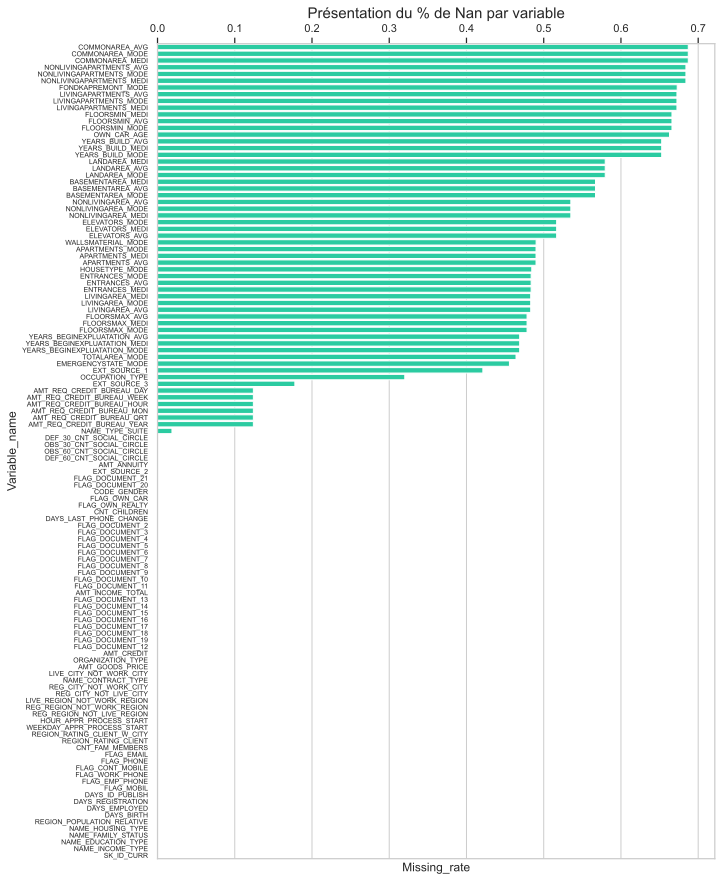

In [53]:
sns.set(style="whitegrid")
plt.figure(figsize=(10, 15))
ax = sns.barplot(x = nan_data_ts['Missing_rate'], y = nan_data_ts['Variable_name'], orient = 'h',color = '#11E5AD' )
ax.xaxis.set_ticks_position('top')
plt.yticks(rotation=0,fontsize=7)
plt.title('Présentation du % de Nan par variable', size=15)
plt.show()

## Remarque:

    * Comme constaté au dessus le taux de valeurs absentes est assez important, donc avant de procéder la construction des modèles nous devrons compléter ces valeurs manquantes par imputation et une dauxième solution est de supprimer les colonnes qui contiennent beaucoups de valeurs NaN, mais il est impossible de savoir à l'avance si ces colonnes seront utiles à notre modèle. Par conséquent, nous conserverons toutes les colonnes pour le moment.
    * Dans les travaux ultérieurs, nous utiliserons des modèles tels que XGBoost qui peuvent gérer les valeurs manquantes sans qu'il soit nécessaire de procéder à une imputation.

## Valeurs aberrantes

    Remarque:Les chiffres de la variable "DAYS_BIRTH" sont négatifs car ils sont enregistrés par rapport à la demande de prêt en cours. D'autre part, ces valeurs sont en jours.
        * DAYS_BIRTH >>>>>>>>>> calcule d'age 		
        * DAYS_EMPLOYED>>>>>>>> remplacer par Nan les valeurs anormales 
        * DAYS_REGISTRATION>>>> les remettre en valeurs positives
        * DAYS_ID_PUBLISH>>>>>> les remettre en valeurs positives
        
### DAYS_BIRTH

In [54]:
c=['DAYS_BIRTH','DAYS_EMPLOYED','DAYS_REGISTRATION','DAYS_ID_PUBLISH' ]

fig = plt.figure(figsize=(8, 4))
ax = plt.axes()
plt.xticks(rotation=45)
#ax.set_ylim([-3,9])
sns.boxplot(data= app_train[c])

<AxesSubplot:>

In [56]:
"""
Pour voir ces valeurs en années, nous pouvons les multiplier par -1 
et les diviser par le nombre de jours dans une année
"""
app_train['DAYS_BIRTH'] = (app_train['DAYS_BIRTH'] / -365)
app_test['DAYS_BIRTH'] = (app_test['DAYS_BIRTH'] / -365)

In [57]:
app_train['DAYS_BIRTH'].describe(),app_test['DAYS_BIRTH'].describe()

(count    307511.000000
 mean         43.936973
 std          11.956133
 min          20.517808
 25%          34.008219
 50%          43.150685
 75%          53.923288
 max          69.120548
 Name: DAYS_BIRTH, dtype: float64,
 count    48744.000000
 mean        44.022150
 std         11.851782
 min         20.104110
 25%         34.235616
 50%         43.246575
 75%         53.800000
 max         69.027397
 Name: DAYS_BIRTH, dtype: float64)

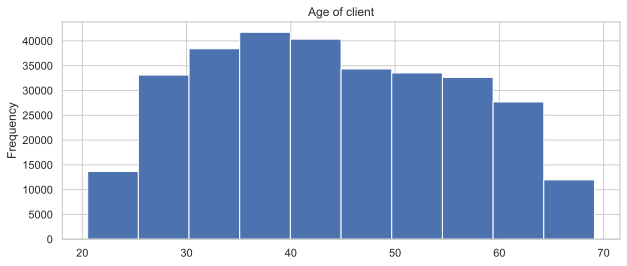

In [58]:
plt.figure(figsize=(10, 4))
app_train['DAYS_BIRTH'].plot(kind='hist')
plt.title('Age of client')
show()

### DAYS_EMPLOYED
    * Certaines valeurs sont négatives et de plus, la valeur maximale est d'environ 1000 ans qui n'est pas normal.

In [59]:
app_train['DAYS_EMPLOYED'].describe()

count    307511.000000
mean      63815.045904
std      141275.766519
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

     * On va remplacer ces valeurs anormales avec des NaN et les imputer après
     How many days before the application the perso...

In [60]:
#Remplacer les anomalies par des nan
app_train['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)
app_test['DAYS_EMPLOYED'].replace({365243: np.nan},  inplace = True)

app_test['DAYS_EMPLOYED']  = ( app_test['DAYS_EMPLOYED'] / -1)
app_train['DAYS_EMPLOYED'] = (app_train['DAYS_EMPLOYED'] / -1)

#app_train['DAYS_EMPLOYED'].plot(kind= 'box')

### DAYS_REGISTRATION, DAYS_ID_PUBLISH

In [61]:
app_train['DAYS_REGISTRATION'] = (app_train['DAYS_REGISTRATION'] / -1)
app_train['DAYS_ID_PUBLISH'] = (app_train['DAYS_ID_PUBLISH'] / -1)

app_test['DAYS_REGISTRATION'] = (app_test['DAYS_REGISTRATION'] / -1)
app_test['DAYS_ID_PUBLISH']   = (app_test['DAYS_ID_PUBLISH']  / -1)


In [62]:
fig = plt.figure(figsize=(8, 4))
ax = plt.axes()
plt.xticks(rotation=45)
#ax.set_ylim([-3,9])
sns.boxplot(data= app_train[c])

<AxesSubplot:>

In [63]:
app_train['DAYS_EMPLOYED'].describe()

count    252137.000000
mean       2384.169325
std        2338.360162
min          -0.000000
25%         767.000000
50%        1648.000000
75%        3175.000000
max       17912.000000
Name: DAYS_EMPLOYED, dtype: float64

In [64]:
HomeCredit_clmns_desc[HomeCredit_clmns_desc['Row'] =='AMT_CREDIT']['Description']

8                              Credit amount of the loan
178    Final credit amount on the previous applicatio...
Name: Description, dtype: object

# Analyse de corrélation

Voici quelques interprétations générales de la valeur absolue du coefficient de corrélation:

Corrélation très faible: valeurs entre 0,00 et 0,19;

Corrélation faible: valeurs entre 0,20 et 0,39;

Corrélation modéré: valeurs entre 0,40 et 0,59;

Corrélation forte: valeurs entre 0,60 et 0,79;

Corrélation très forte: valeurs entre 0,80 et 1,0.

In [65]:
#Corrélation avec la 'Target'
correlations = app_train.corr()['TARGET'].sort_values()

In [66]:
correlations.head(20),correlations.tail(20),


(EXT_SOURCE_3                 -0.178919
 EXT_SOURCE_2                 -0.160472
 EXT_SOURCE_1                 -0.155317
 DAYS_BIRTH                   -0.078239
 DAYS_EMPLOYED                -0.074958
 DAYS_ID_PUBLISH              -0.051457
 FLOORSMAX_AVG                -0.044003
 FLOORSMAX_MEDI               -0.043768
 FLOORSMAX_MODE               -0.043226
 DAYS_REGISTRATION            -0.041975
 AMT_GOODS_PRICE              -0.039645
 REGION_POPULATION_RELATIVE   -0.037227
 ELEVATORS_AVG                -0.034199
 ELEVATORS_MEDI               -0.033863
 FLOORSMIN_AVG                -0.033614
 FLOORSMIN_MEDI               -0.033394
 LIVINGAREA_AVG               -0.032997
 LIVINGAREA_MEDI              -0.032739
 FLOORSMIN_MODE               -0.032698
 TOTALAREA_MODE               -0.032596
 Name: TARGET, dtype: float64,
 REG_REGION_NOT_LIVE_REGION     0.005576
 REG_REGION_NOT_WORK_REGION     0.006942
 OBS_60_CNT_SOCIAL_CIRCLE       0.009022
 OBS_30_CNT_SOCIAL_CIRCLE       0.009131
 CNT_

In [67]:
correlations

EXT_SOURCE_3                  -0.178919
EXT_SOURCE_2                  -0.160472
EXT_SOURCE_1                  -0.155317
DAYS_BIRTH                    -0.078239
DAYS_EMPLOYED                 -0.074958
                                 ...   
REG_CITY_NOT_WORK_CITY         0.050994
DAYS_LAST_PHONE_CHANGE         0.055218
REGION_RATING_CLIENT           0.058899
REGION_RATING_CLIENT_W_CITY    0.060893
TARGET                         1.000000
Name: TARGET, Length: 106, dtype: float64

In [68]:
#Extraire les variables EXT_SOURCE et afficher les corrélations
corr_list=['TARGET','EXT_SOURCE_3','EXT_SOURCE_2','EXT_SOURCE_1','DAYS_BIRTH','DAYS_EMPLOYED','DAYS_ID_PUBLISH']
data_corrs = app_train[corr_list].corr()
data_corrs

,TARGET,EXT_SOURCE_3,EXT_SOURCE_2,EXT_SOURCE_1,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH
TARGET,1.000000,-0.178919,-0.160472,-0.155317,-0.078239,-0.074958,-0.051457
EXT_SOURCE_3,-0.178919,1.000000,0.109167,0.186846,0.205478,0.129722,0.131597
EXT_SOURCE_2,-0.160472,0.109167,1.000000,0.213982,0.091996,0.093444,0.050955
EXT_SOURCE_1,-0.155317,0.186846,0.213982,1.000000,0.600610,0.252712,0.132375
DAYS_BIRTH,-0.078239,0.205478,0.091996,0.600610,1.000000,0.352321,0.272691
DAYS_EMPLOYED,-0.074958,0.129722,0.093444,0.252712,0.352321,1.000000,0.089869
DAYS_ID_PUBLISH,-0.051457,0.131597,0.050955,0.132375,0.272691,0.089869,1.000000


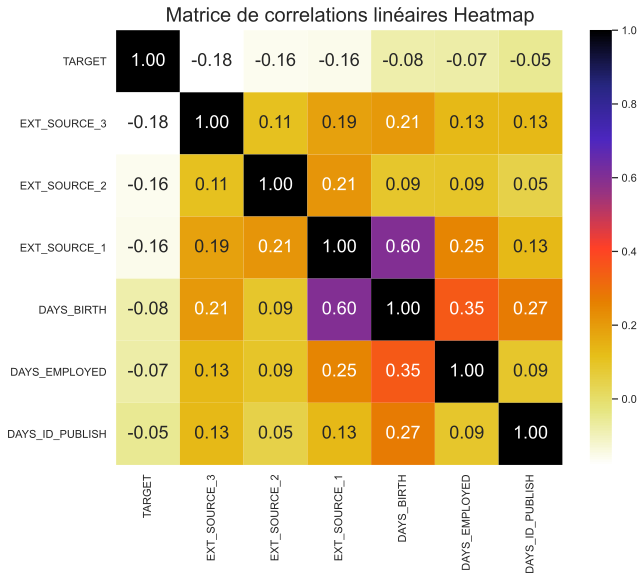

In [69]:
#cor = data_explt.corr()
fig, ax = plt.subplots(figsize=(10,8)) 
sns.heatmap(data_corrs, annot=True, cmap= plt.cm.CMRmap_r,fmt='.2f', annot_kws={"size": 18})
plt.suptitle('Matrice de correlations linéaires Heatmap',x=0.45,y=0.92, fontsize = 20)
plt.show()

    * La première constatation est que la corrélation n'est pas très forte (en fait, elles sont toutes considérées comme très faibles), mais ces variables seront toujours utiles pour un modèle d'apprentissage automatique permettant de prédire si un demandeur remboursera ou non un prêt à temps.
    *Les trois caractéristiques 'EXT_SOURCE' ont des corrélations négatives avec la 'Target', ce qui indique que plus la valeur de 'EXT_SOURCE' augmente le client est plus susceptible de rembourser le prêt. Nous pouvons également voir que 'DAYS_BIRTH' est positivement corrélé avec 'EXT_SOURCE_1', ce qui indique que l'un des facteurs de ce score est peut-être l'âge du client.

## Import des fonctions 'Karnel de référence'


Pour cette partie du projet, nous allons nous appuyer sur le kernel Kaggle "LightGBM with Simple Features" 

L'auteur réalise une approche par fonctions, ce qui est pratique en plus d'avoir un score public très satisfaisant de 0.79070. Cependant, le kernel ne sera pas repris sur la partie Machine Learning. Cette derniére sera intégralement réalisé de manière autonome à partir de la 6ème partie de ce projet.

Nous allons procéder, dans cette prtie, à l'import de l'ensemble des fonctions qui nous seront utiles.
Certaines de ces fonctions sont importées telle quelle depuis le kernel de référence. D'autres ont été modifiées pour coller aux besoins spécifiques du projet.
De plus, nous allons profiter pour déclarer ou importer l'ensemble des fonctions nécessaires pour la suite du projet.



# Train and Test

In [70]:
pd.set_option("display.max_rows", 300)
pd.set_option("display.max_columns", 300)

In [71]:
df1 = app_train.select_dtypes(['float64','int64'])

In [72]:
df1.shape

(307511, 106)

In [73]:
def heatmap_correlation(df) :
    corr = df.corr()
    plt.figure(figsize=(35,30))
    
    sns.heatmap(corr , annot=True, linewidths=.2, cmap="YlGnBu", fmt='.2f', annot_kws={"size": 6},square=True);

In [ ]:
heatmap_correlation(df1)

In [ ]:
lis = ['APARTMENTS_AVG','BASEMENTAREA_AVG','YEARS_BEGINEXPLUATATION_AVG','YEARS_BUILD_AVG','COMMONAREA_AVG',
       'ELEVATORS_AVG','ENTRANCES_AVG','FLOORSMAX_AVG','FLOORSMIN_AVG','LANDAREA_AVG','LIVINGAPARTMENTS_AVG',
       'LIVINGAREA_AVG','NONLIVINGAPARTMENTS_AVG','NONLIVINGAREA_AVG','APARTMENTS_MODE','BASEMENTAREA_MODE',
       'YEARS_BEGINEXPLUATATION_MODE','YEARS_BUILD_MODE','COMMONAREA_MODE','ELEVATORS_MODE','ENTRANCES_MODE','FLOORSMAX_MODE',
       'FLOORSMIN_MODE','LANDAREA_MODE','LIVINGAPARTMENTS_MODE','LIVINGAREA_MODE','NONLIVINGAPARTMENTS_MODE',
       'NONLIVINGAREA_MODE','APARTMENTS_MEDI','BASEMENTAREA_MEDI','YEARS_BEGINEXPLUATATION_MEDI','YEARS_BUILD_MEDI',
       'COMMONAREA_MEDI','ELEVATORS_MEDI','ENTRANCES_MEDI','FLOORSMAX_MEDI','FLOORSMIN_MEDI','LANDAREA_MEDI',
       'LIVINGAPARTMENTS_MEDI','LIVINGAREA_MEDI','NONLIVINGAPARTMENTS_MEDI','NONLIVINGAREA_MEDI','TOTALAREA_MODE',]

In [ ]:
corr =df1[lis].corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(20, 12))
    ax = sns.heatmap(corr, mask=mask, annot=True, linewidths=.2, cmap="YlGnBu", fmt='.2f', annot_kws={"size": 6},square=True)

In [ ]:
lis2 = ['YEARS_BEGINEXPLUATATION_MEDI','YEARS_BUILD_MEDI',
       'COMMONAREA_MEDI','ENTRANCES_MEDI','FLOORSMIN_MEDI','LANDAREA_MEDI',
       'NONLIVINGAPARTMENTS_MEDI','NONLIVINGAREA_MEDI']
corr = df1[lis2].corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(10,7))
    ax = sns.heatmap(corr, mask=mask, annot=True, linewidths=.2, cmap="YlGnBu", fmt='.2f', annot_kws={"size": 6},square=True)

In [ ]:
lis3 = ['SK_ID_CURR','TARGET','AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY',
        'REGION_POPULATION_RELATIVE','DAYS_BIRTH','DAYS_EMPLOYED','DAYS_REGISTRATION','DAYS_ID_PUBLISH','OWN_CAR_AGE',
        'FLAG_MOBIL','FLAG_WORK_PHONE','FLAG_CONT_MOBILE','FLAG_PHONE','FLAG_EMAIL','CNT_FAM_MEMBERS',
        'REGION_RATING_CLIENT_W_CITY','HOUR_APPR_PROCESS_START','REG_REGION_NOT_LIVE_REGION','LIVE_REGION_NOT_WORK_REGION',
        'REG_CITY_NOT_LIVE_CITY','LIVE_CITY_NOT_WORK_CITY','EXT_SOURCE_1','EXT_SOURCE_2','EXT_SOURCE_3',
        'OBS_60_CNT_SOCIAL_CIRCLE','DEF_60_CNT_SOCIAL_CIRCLE','DAYS_LAST_PHONE_CHANGE','FLAG_DOCUMENT_2',
        'FLAG_DOCUMENT_3','FLAG_DOCUMENT_4','FLAG_DOCUMENT_5','FLAG_DOCUMENT_7',
        'FLAG_DOCUMENT_8','FLAG_DOCUMENT_9','FLAG_DOCUMENT_10','FLAG_DOCUMENT_11','FLAG_DOCUMENT_12',
        'FLAG_DOCUMENT_13','FLAG_DOCUMENT_14','FLAG_DOCUMENT_15','FLAG_DOCUMENT_16','FLAG_DOCUMENT_17','FLAG_DOCUMENT_18',
        'FLAG_DOCUMENT_19','FLAG_DOCUMENT_20','FLAG_DOCUMENT_21','AMT_REQ_CREDIT_BUREAU_HOUR',
        'AMT_REQ_CREDIT_BUREAU_DAY','AMT_REQ_CREDIT_BUREAU_WEEK','AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_QRT','AMT_REQ_CREDIT_BUREAU_YEAR']
corr = df1[lis3].corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(30,20))
    ax = sns.heatmap(corr, mask=mask, annot=True, linewidths=.2, cmap="YlGnBu", fmt='.2f', annot_kws={"size": 6},square=True)

In [ ]:

lis4 = ['YEARS_BEGINEXPLUATATION_MEDI','YEARS_BUILD_MEDI',
       'COMMONAREA_MEDI','ENTRANCES_MEDI','FLOORSMIN_MEDI','LANDAREA_MEDI',
       'NONLIVINGAPARTMENTS_MEDI','NONLIVINGAREA_MEDI','SK_ID_CURR','TARGET','AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY',
        'REGION_POPULATION_RELATIVE','DAYS_BIRTH','DAYS_EMPLOYED','DAYS_REGISTRATION','DAYS_ID_PUBLISH','OWN_CAR_AGE',
        'CNT_FAM_MEMBERS',
        'REGION_RATING_CLIENT_W_CITY','HOUR_APPR_PROCESS_START','REG_REGION_NOT_LIVE_REGION','LIVE_REGION_NOT_WORK_REGION',
        'REG_CITY_NOT_LIVE_CITY','LIVE_CITY_NOT_WORK_CITY','EXT_SOURCE_1','EXT_SOURCE_2','EXT_SOURCE_3',
        'OBS_60_CNT_SOCIAL_CIRCLE','DEF_60_CNT_SOCIAL_CIRCLE','DAYS_LAST_PHONE_CHANGE','AMT_REQ_CREDIT_BUREAU_HOUR',
        'AMT_REQ_CREDIT_BUREAU_DAY','AMT_REQ_CREDIT_BUREAU_WEEK','AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_QRT',
        'AMT_REQ_CREDIT_BUREAU_YEAR']
corr = df1[lis4].corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(30,20))
    ax = sns.heatmap(corr, mask=mask, annot=True, linewidths=.2, cmap="YlGnBu", fmt='.2f', annot_kws={"size": 6},square=True)

In [ ]:
size(lis4)

In [ ]:
#for col in df1.columns:
    #print(col)

In [ ]:
HomeCredit_clmns_desc[HomeCredit_clmns_desc['Row'] =='EXT_SOURCE_3']['Description']

In [ ]:
df2 = app_train.select_dtypes('object')

In [ ]:
df2.shape

In [ ]:
for c in ['OCCUPATION_TYPE' ,'NAME_INCOME_TYPE','NAME_FAMILY_STATUS','NAME_EDUCATION_TYPE','NAME_CONTRACT_TYPE' ]:
    print (df2[c].unique())

In [ ]:
df2.nunique().sort_values(ascending = False)

In [ ]:
obj_list_to_remove = ['CODE_GENDER','FLAG_OWN_CAR','FLAG_OWN_REALTY','ORGANIZATION_TYPE','NAME_TYPE_SUITE',
            'NAME_HOUSING_TYPE','WEEKDAY_APPR_PROCESS_START','WALLSMATERIAL_MODE', 'FONDKAPREMONT_MODE',
           'HOUSETYPE_MODE','EMERGENCYSTATE_MODE']

In [ ]:
#Family status remapped
dic = {'Single / not married':'not_married', 'Married':'married', 'Civil marriage':'married', 'Widow':'other',
       'Separated':'other', 'Unknown':'other'}
df2=df2.replace({"NAME_FAMILY_STATUS": dic})

In [ ]:
# NAME_INCOME_TYPE remapped
dic = {'Working':'working', 'State servant':'working', 'Commercial associate':'working', 'Pensioner':'working',
       'Unemployed':'not_working', 'Student':'not_working', 'Businessman':'working', 'Maternity leave':'not_working'}
df2=df2.replace({"NAME_INCOME_TYPE": dic})

In [ ]:
# OCCUPATION_TYPE remapped
dic = {'Laborers':'other', 'Core staff':'other', 'Accountants':'other', 'Managers':'other',
       'Drivers':'other', 'Sales staff':'other', 'Cleaning staff':'other', 'Cooking staff':'other',
       'Private service staff':'other', 'Medicine staff':'other', 'Security staff':'other',
       'High skill tech staff':'other', 'Waiters/barmen staff':'other',
       'Low-skill Laborers':'Low-skill Laborers', 'Realty agents':'other', 'Secretaries':'other', 'IT staff':'other',
       'HR staff':'other'}
df2=df2.replace({"OCCUPATION_TYPE": dic})

In [ ]:
# NAME_EDUCATION_TYPE remapped
dic = {'Secondary / secondary special':'low_educ', 'Higher education':'high_educ',
       'Incomplete higher':'low_educ', 'Lower secondary':'low_educ', 'Academic degree':'high_educ'}
df2=df2.replace({"NAME_EDUCATION_TYPE": dic})

In [ ]:
df2['NAME_CONTRACT_TYPE'].unique()

In [ ]:
list_save = ['YEARS_BEGINEXPLUATATION_MEDI','YEARS_BUILD_MEDI','COMMONAREA_MEDI','ENTRANCES_MEDI','FLOORSMIN_MEDI',
             'LANDAREA_MEDI','NONLIVINGAPARTMENTS_MEDI','NONLIVINGAREA_MEDI','SK_ID_CURR','TARGET','AMT_INCOME_TOTAL',
             'AMT_CREDIT','AMT_ANNUITY','REGION_POPULATION_RELATIVE','DAYS_BIRTH','DAYS_EMPLOYED','DAYS_REGISTRATION',
             'DAYS_ID_PUBLISH','OWN_CAR_AGE','CNT_FAM_MEMBERS','REGION_RATING_CLIENT_W_CITY','HOUR_APPR_PROCESS_START',
             'REG_REGION_NOT_LIVE_REGION','LIVE_REGION_NOT_WORK_REGION','REG_CITY_NOT_LIVE_CITY','LIVE_CITY_NOT_WORK_CITY',
             'EXT_SOURCE_1','EXT_SOURCE_2','EXT_SOURCE_3','OBS_60_CNT_SOCIAL_CIRCLE','DEF_60_CNT_SOCIAL_CIRCLE',
             'DAYS_LAST_PHONE_CHANGE','AMT_REQ_CREDIT_BUREAU_HOUR','AMT_REQ_CREDIT_BUREAU_DAY','AMT_REQ_CREDIT_BUREAU_WEEK',
             'AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_QRT','AMT_REQ_CREDIT_BUREAU_YEAR',
            'OCCUPATION_TYPE' ,'NAME_INCOME_TYPE','NAME_FAMILY_STATUS','NAME_EDUCATION_TYPE','NAME_CONTRACT_TYPE']

#  Bureau

In [ ]:
bureau.select_dtypes('object').nunique()

In [ ]:
corr =bureau.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(15, 8))
    ax = sns.heatmap(corr, mask=mask, annot=True, linewidths=.2, cmap="YlGnBu", fmt='.2f', annot_kws={"size": 7},square=True)

In [ ]:
list_bureau = ['SK_ID_CURR', 'SK_ID_BUREAU', 'CREDIT_ACTIVE','DAYS_CREDIT', 'CREDIT_DAY_OVERDUE',
               'AMT_CREDIT_MAX_OVERDUE', 'CNT_CREDIT_PROLONG','AMT_CREDIT_SUM','AMT_CREDIT_SUM_LIMIT',
               'AMT_CREDIT_SUM_OVERDUE'
              ]

# bureau_balance

In [ ]:
bureau_blc.select_dtypes('object').nunique()

In [ ]:
bureau_blc.columns

# credit_card_blc

In [ ]:
credit_card_blc.select_dtypes('object').nunique()

In [ ]:
corr =credit_card_blc.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(15, 8))
    ax = sns.heatmap(corr, mask=mask, annot=True, linewidths=.2, cmap="YlGnBu", fmt='.2f', annot_kws={"size": 7},square=True)

In [ ]:
list_cc = [
    #'SK_ID_PREV', 'SK_ID_CURR', 
           'MONTHS_BALANCE', 'AMT_BALANCE',
       'AMT_CREDIT_LIMIT_ACTUAL', 'AMT_DRAWINGS_ATM_CURRENT',
       'AMT_DRAWINGS_CURRENT', 'AMT_DRAWINGS_OTHER_CURRENT',
       'AMT_DRAWINGS_POS_CURRENT',
       'AMT_PAYMENT_CURRENT',
        'CNT_DRAWINGS_CURRENT',
       'CNT_DRAWINGS_OTHER_CURRENT', 
       'CNT_INSTALMENT_MATURE_CUM', 'NAME_CONTRACT_STATUS', 'SK_DPD',
       'SK_DPD_DEF']

# previous_application

In [ ]:
corr =previous_app.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(15, 8))
    ax = sns.heatmap(corr, mask=mask, annot=True, linewidths=.2, cmap="YlGnBu", fmt='.2f', annot_kws={"size": 7},square=True)

In [ ]:
list_previous_app= ['SK_ID_PREV', 'SK_ID_CURR',  'NAME_CONTRACT_STATUS', 'CODE_REJECT_REASON', 
                    'NAME_CLIENT_TYPE','DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 
                    'DAYS_TERMINATION','AMT_CREDIT','AMT_DOWN_PAYMENT','HOUR_APPR_PROCESS_START','RATE_DOWN_PAYMENT',
                    'DAYS_DECISION', 'CNT_PAYMENT']

In [ ]:
previous_app.select_dtypes('object').nunique()

# POS_CASH_balance

In [ ]:
POS_CASH_balance

In [ ]:
corr =POS_CASH_balance.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(10, 5))
    ax = sns.heatmap(corr, mask=mask, annot=True, linewidths=.2, cmap="YlGnBu", fmt='.2f', annot_kws={"size": 7},square=True)

In [ ]:
POS_CASH_balance.select_dtypes('object').nunique()

In [ ]:
POS_CASH_balance.columns

# inst_payments

In [ ]:
inst_payments

In [ ]:
corr =inst_payments.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(10, 5))
    ax = sns.heatmap(corr, mask=mask, annot=True, linewidths=.2, cmap="YlGnBu", fmt='.2f', annot_kws={"size": 7},square=True)

In [ ]:
inst_payments.select_dtypes('object').nunique()

In [ ]:
['SK_ID_PREV', 
 'SK_ID_CURR', 
 'NUM_INSTALMENT_VERSION',
 'NUM_INSTALMENT_NUMBER', 
 #'DAYS_INSTALMENT', 
 #'DAYS_ENTRY_PAYMENT',
 #'AMT_INSTALMENT', 
 'AMT_PAYMENT']

In [ ]:
for col in POS_CASH_balance.columns:
    if col in list_previous_app:
        print(col)